# Timeseries

Time-series analysis with pandas and prophet.

check:  
```
conda install -c conda-forge fbprophet 
pip install cython==0.28.5
```

todo: 
- split timeseries in train, validation and test accuracy of the forecast...

In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [50]:
import pandas as pd
from plotnine import *
import hvplot.pandas

from fbprophet import Prophet
# the following line is currently required to allow plotting of datetime dataframe columns in prophet
pd.plotting.register_matplotlib_converters()


ERROR:fbprophet:Importing plotly failed. Interactive plots will not work.


As always, let's first inspect the data so we know how to import the file properly. This time, we call `head` directly on the tar.gz file using the pip operator `|`. The file is stored in the data folder of the repository (we downloaded from [this url](ftp://aftp.cmdl.noaa.gov/data/trace_gases/co2/in-situ/surface/mlo/co2_mlo_surface-insitu_1_ccgg_HourlyData.txt)).  

In [22]:
datafile = '../data/noaa_mauna_loa/co2_mlo_surface-insitu_1_ccgg_HourlyData.txt.tgz'

In [27]:
! ls -l {datafile}
! tar -xzOf {datafile} | head 

-rw-r--r-- 1 65536 65536 2440647 Aug 28 23:28 ../data/noaa_mauna_loa/co2_mlo_surface-insitu_1_ccgg_HourlyData.txt.tgz
# header_lines : 150
#
# ------------------------------------------------------------->>>>
# DATA SET NAME
#
# dataset_name: co2_mlo_surface-insitu_1_ccgg_HourlyData
#
# ------------------------------------------------------------->>>>
# DESCRIPTION
#
tar: co2_mlo_surface-insitu_1_ccgg_HourlyData.txt: Cannot write: Broken pipe
tar: Exiting with failure status due to previous errors


Seems like we have to skip a full 149 lines before we reach actual data (line 150 is the header line)! If you repeat the command above with `head -n 150` you can read all the metadata. We learn that we should also catch the NaN values -999.99, -99.99 and None. 

We pass those arguments and do not specify an index column this time. As always, we inspect the read success.

In [31]:
df = pd.read_csv(datafile, compression='gzip', skiprows=149, comment='#', sep=' ', na_values=[-999.99, -99.99, None])
display(df.head())
df.tail()

,site_code,year,month,day,hour,minute,second,value,value_std_dev,nvalue,latitude,longitude,altitude,elevation,intake_height,instrument,qcflag
0,MLO,1973.0,1.0,1.0,0.0,0.0,0.0,NaN,NaN,0.0,19.536,-155.576,3437.0,3397.0,40.0,NaN,*..
1,MLO,1973.0,1.0,1.0,1.0,0.0,0.0,NaN,NaN,0.0,19.536,-155.576,3437.0,3397.0,40.0,NaN,*..
2,MLO,1973.0,1.0,1.0,2.0,0.0,0.0,NaN,NaN,0.0,19.536,-155.576,3437.0,3397.0,40.0,NaN,*..
3,MLO,1973.0,1.0,1.0,3.0,0.0,0.0,NaN,NaN,0.0,19.536,-155.576,3437.0,3397.0,40.0,NaN,*..
4,MLO,1973.0,1.0,1.0,4.0,0.0,0.0,NaN,NaN,0.0,19.536,-155.576,3437.0,3397.0,40.0,NaN,*..


,site_code,year,month,day,hour,minute,second,value,value_std_dev,nvalue,latitude,longitude,altitude,elevation,intake_height,instrument,qcflag
403220,MLO,2018.0,12.0,31.0,20.0,0.0,0.0,410.08,0.13,234.0,19.536,-155.576,3437.0,3397.0,40.0,LI3-2,...
403221,MLO,2018.0,12.0,31.0,21.0,0.0,0.0,409.84,0.07,234.0,19.536,-155.576,3437.0,3397.0,40.0,LI3-2,.U.
403222,MLO,2018.0,12.0,31.0,22.0,0.0,0.0,409.81,0.07,234.0,19.536,-155.576,3437.0,3397.0,40.0,LI3-2,.U.
403223,MLO,2018.0,12.0,31.0,23.0,0.0,0.0,409.67,0.04,234.0,19.536,-155.576,3437.0,3397.0,40.0,LI3-2,.U.
403224,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Seems like there is a slight problem in the last line. The original file had an empty row at the end and this created a row of all NaN values. This is usually not a problem, but NaN in the index is a problem and thus we remove the last line.

In [33]:
df = df.iloc[0:len(df)-1]

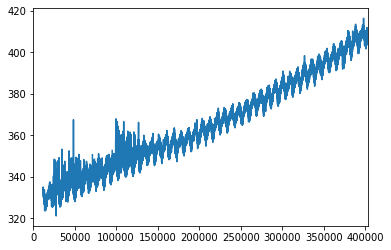

In [34]:
df.value.plot();

The datetime information in provided in seperate columns. We use `to_datetime()` to combine them into a datetime column called dt and deine this column as the index of the dataframe.

In [35]:
## Add a datetime index and inspect interactivly with hvplot
df['dt'] = pd.to_datetime(df[['year', 'month', 'day', 'hour']])
df.set_index('dt', inplace=True)

display(df.head())
df.value.hvplot()

,site_code,year,month,day,hour,minute,second,value,value_std_dev,nvalue,latitude,longitude,altitude,elevation,intake_height,instrument,qcflag
dt,,,,,,,,,,,,,,,,,
1973-01-01 00:00:00,MLO,1973.0,1.0,1.0,0.0,0.0,0.0,NaN,NaN,0.0,19.536,-155.576,3437.0,3397.0,40.0,NaN,*..
1973-01-01 01:00:00,MLO,1973.0,1.0,1.0,1.0,0.0,0.0,NaN,NaN,0.0,19.536,-155.576,3437.0,3397.0,40.0,NaN,*..
1973-01-01 02:00:00,MLO,1973.0,1.0,1.0,2.0,0.0,0.0,NaN,NaN,0.0,19.536,-155.576,3437.0,3397.0,40.0,NaN,*..
1973-01-01 03:00:00,MLO,1973.0,1.0,1.0,3.0,0.0,0.0,NaN,NaN,0.0,19.536,-155.576,3437.0,3397.0,40.0,NaN,*..
1973-01-01 04:00:00,MLO,1973.0,1.0,1.0,4.0,0.0,0.0,NaN,NaN,0.0,19.536,-155.576,3437.0,3397.0,40.0,NaN,*..


:Curve   [dt]   (value)

As expected this data has a really strong trend signal. However, we also see that the data has some odd features before 1990. Some into the plot to investigate a bit.
We can also have a look at a given date (note the string notation for dates in pandas) in the table.

In [7]:
# lets look at a funny period in detail
df.loc['1984-7-20']

,site_code,year,month,day,hour,minute,second,value,value_std_dev,nvalue,latitude,longitude,altitude,elevation,intake_height,instrument,qcflag
dt,,,,,,,,,,,,,,,,,
1984-07-20 00:00:00,MLO,1984,7,20,0,0,0,343.88,0.0,1,19.536,-155.576,3437.0,3397.0,40.0,UR1-1,.U.
1984-07-20 01:00:00,MLO,1984,7,20,1,0,0,NaN,NaN,0,19.536,-155.576,3437.0,3397.0,40.0,UR1-1,*..
1984-07-20 02:00:00,MLO,1984,7,20,2,0,0,NaN,NaN,0,19.536,-155.576,3437.0,3397.0,40.0,UR1-1,*..
1984-07-20 03:00:00,MLO,1984,7,20,3,0,0,NaN,NaN,0,19.536,-155.576,3437.0,3397.0,40.0,UR1-1,*..
1984-07-20 04:00:00,MLO,1984,7,20,4,0,0,NaN,NaN,0,19.536,-155.576,3437.0,3397.0,40.0,UR1-1,*..
1984-07-20 05:00:00,MLO,1984,7,20,5,0,0,NaN,NaN,0,19.536,-155.576,3437.0,3397.0,40.0,UR1-1,*..
1984-07-20 06:00:00,MLO,1984,7,20,6,0,0,NaN,NaN,0,19.536,-155.576,3437.0,3397.0,40.0,UR1-1,*..
1984-07-20 07:00:00,MLO,1984,7,20,7,0,0,NaN,NaN,0,19.536,-155.576,3437.0,3397.0,40.0,UR1-1,*..
1984-07-20 08:00:00,MLO,1984,7,20,8,0,0,NaN,NaN,0,19.536,-155.576,3437.0,3397.0,40.0,UR1-1,*..


It seems like the spikes occure after a period of missing data? We ignore this for now and do some aggregation.

In [38]:
# ignoring the odd data before 1990 for now we aggregate the data to daily values
df_daily = df.groupby(df.index.floor('d')).mean()
df_daily.head()

,year,month,day,hour,minute,second,value,value_std_dev,nvalue,latitude,longitude,altitude,elevation,intake_height
dt,,,,,,,,,,,,,,
1973-01-01,1973.0,1.0,1.0,11.5,0.0,0.0,NaN,NaN,0.0,19.536,-155.576,3437.0,3397.0,40.0
1973-01-02,1973.0,1.0,2.0,11.5,0.0,0.0,NaN,NaN,0.0,19.536,-155.576,3437.0,3397.0,40.0
1973-01-03,1973.0,1.0,3.0,11.5,0.0,0.0,NaN,NaN,0.0,19.536,-155.576,3437.0,3397.0,40.0
1973-01-04,1973.0,1.0,4.0,11.5,0.0,0.0,NaN,NaN,0.0,19.536,-155.576,3437.0,3397.0,40.0
1973-01-05,1973.0,1.0,5.0,11.5,0.0,0.0,NaN,NaN,0.0,19.536,-155.576,3437.0,3397.0,40.0


Let's plot the aggregated values again. Even without a proper data cleaning we can see that most of these odd incidents are now gone (note, for a proper analysis we'd want to do an actual data cleaning)...

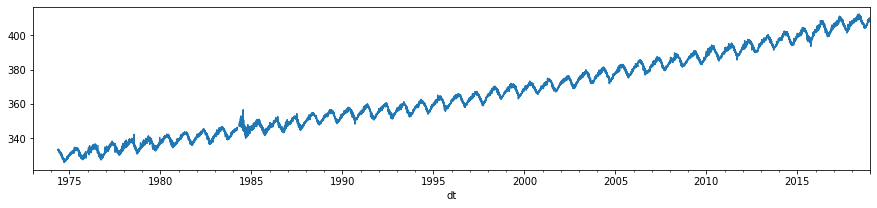

In [39]:
df_daily.value.plot(figsize=(15,3));

For further analysis we create some new features in our dataframe. From the new date index we derive the day-of-the-year (doy) and also convert the year and month columns from floast to int types.

In [43]:
df_daily['doy'] = df.index.to_series().dt.dayofyear
df_daily = df_daily[df_daily.doy.notnull()]
df_daily['year'] = df_daily['year'].astype('int')
df_daily['month'] = df_daily['month'].astype('int')
df_daily.head()

,year,month,day,hour,minute,second,value,value_std_dev,nvalue,latitude,longitude,altitude,elevation,intake_height,doy
dt,,,,,,,,,,,,,,,
1973-01-01,1973,1,1.0,11.5,0.0,0.0,NaN,NaN,0.0,19.536,-155.576,3437.0,3397.0,40.0,1
1973-01-02,1973,1,2.0,11.5,0.0,0.0,NaN,NaN,0.0,19.536,-155.576,3437.0,3397.0,40.0,2
1973-01-03,1973,1,3.0,11.5,0.0,0.0,NaN,NaN,0.0,19.536,-155.576,3437.0,3397.0,40.0,3
1973-01-04,1973,1,4.0,11.5,0.0,0.0,NaN,NaN,0.0,19.536,-155.576,3437.0,3397.0,40.0,4
1973-01-05,1973,1,5.0,11.5,0.0,0.0,NaN,NaN,0.0,19.536,-155.576,3437.0,3397.0,40.0,5


Let's experiment a bit with visualizations for the timeseries. We can use almost any of the visualization packages we've seen, but the step-wise development of graphs with `plotnine` (ggplot2 style) is still a favourite of mine so let's use it. 

Feel free to replicate the plots with one or more of the other plotting packages though!

/opt/conda/lib/python3.6/site-packages/plotnine/scales/scale.py:93: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if cbook.iterable(self.breaks) and cbook.iterable(self.labels):
/opt/conda/lib/python3.6/site-packages/plotnine/geoms/geom_path.py:74: UserWarning: geom_path: Removed 2 rows containing missing values.
  warn(msg.format(n1-n2))
/opt/conda/lib/python3.6/site-packages/plotnine/utils.py:553: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  return cbook.iterable(var) and not is_string(var)
/opt/conda/lib/python3.6/site-packages/plotnine/geoms/geom_path.py:74: UserWarning: geom_path: Removed 136 rows containing missing values.
  warn(msg.format(n1-n2))
/opt/conda/lib/python3.6/site-packages/plotnine/geoms/geom_path.py:74: UserWarning: geom_path: Removed 28 rows containing missing values.
  warn(m

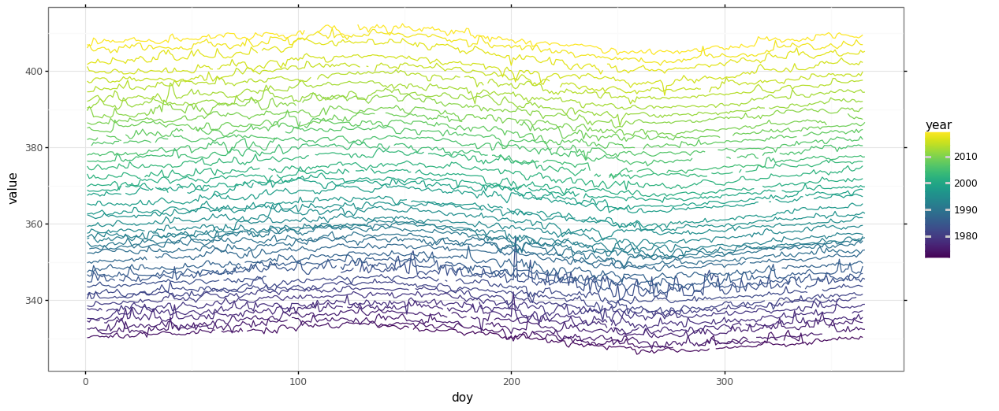

In [44]:
p = ggplot(df_daily, aes(x='doy', y='value'))
for y in range(1973, 2019):
    p += geom_line(aes(colour='year'), data=df_daily[df_daily.year == y])
p += theme_bw()
p += theme(figure_size=(14,6))
p.draw();

Hm, probably not the most effective visualization. Maybe you can improve on it?

We can try something else. Obviously, there is a strong annual seasonality in the timeseries. We can calculate and plot the seasonality like this: 

/opt/conda/lib/python3.6/site-packages/plotnine/scales/scale.py:93: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if cbook.iterable(self.breaks) and cbook.iterable(self.labels):
/opt/conda/lib/python3.6/site-packages/plotnine/utils.py:553: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  return cbook.iterable(var) and not is_string(var)


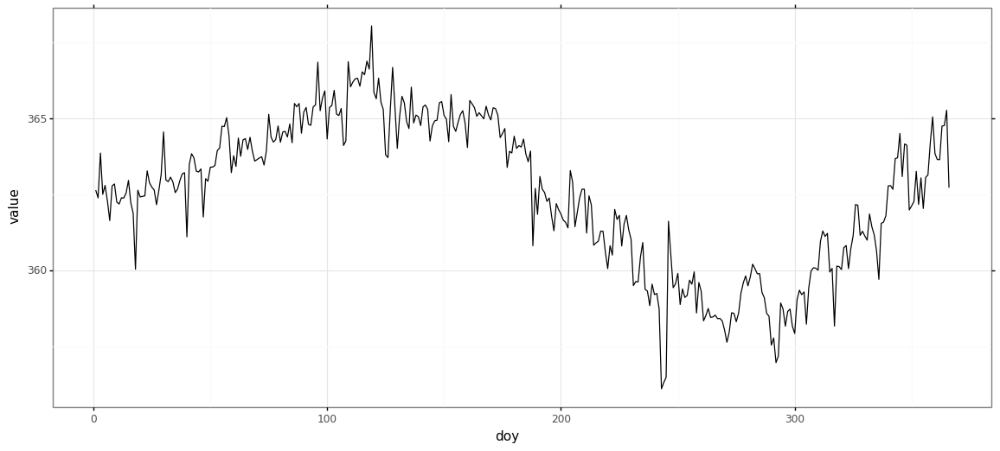

In [46]:
p = ggplot(df_daily.groupby(df_daily.index.dayofyear).median(), aes(x='doy', y='value'))
p += geom_line()
p += theme_bw()
p += theme(figure_size=(14,6))
p.draw();

One other option would be to explicitly show the seasonality for all years in small facets. Note that we give `~year` to the `facet_wrap()` method indicating that the facets should be created for all years.  Let's try:

/opt/conda/lib/python3.6/site-packages/plotnine/scales/scale.py:93: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if cbook.iterable(self.breaks) and cbook.iterable(self.labels):
/opt/conda/lib/python3.6/site-packages/mizani/bounds.py:352: RuntimeWarning: invalid value encountered in less
  outside = (x < range[0]) | (x > range[1])
/opt/conda/lib/python3.6/site-packages/mizani/bounds.py:352: RuntimeWarning: invalid value encountered in greater
  outside = (x < range[0]) | (x > range[1])
/opt/conda/lib/python3.6/site-packages/matplotlib/colors.py:479: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/opt/conda/lib/python3.6/site-packages/plotnine/geoms/geom_path.py:74: UserWarning: geom_path: Removed 501 rows containing missing values.
  warn(msg.format(n1-n2))
/opt/conda/lib/python3.6/site-packages/plotnine/utils.py:553: MatplotlibDeprecationWarning: 
The iterable function w

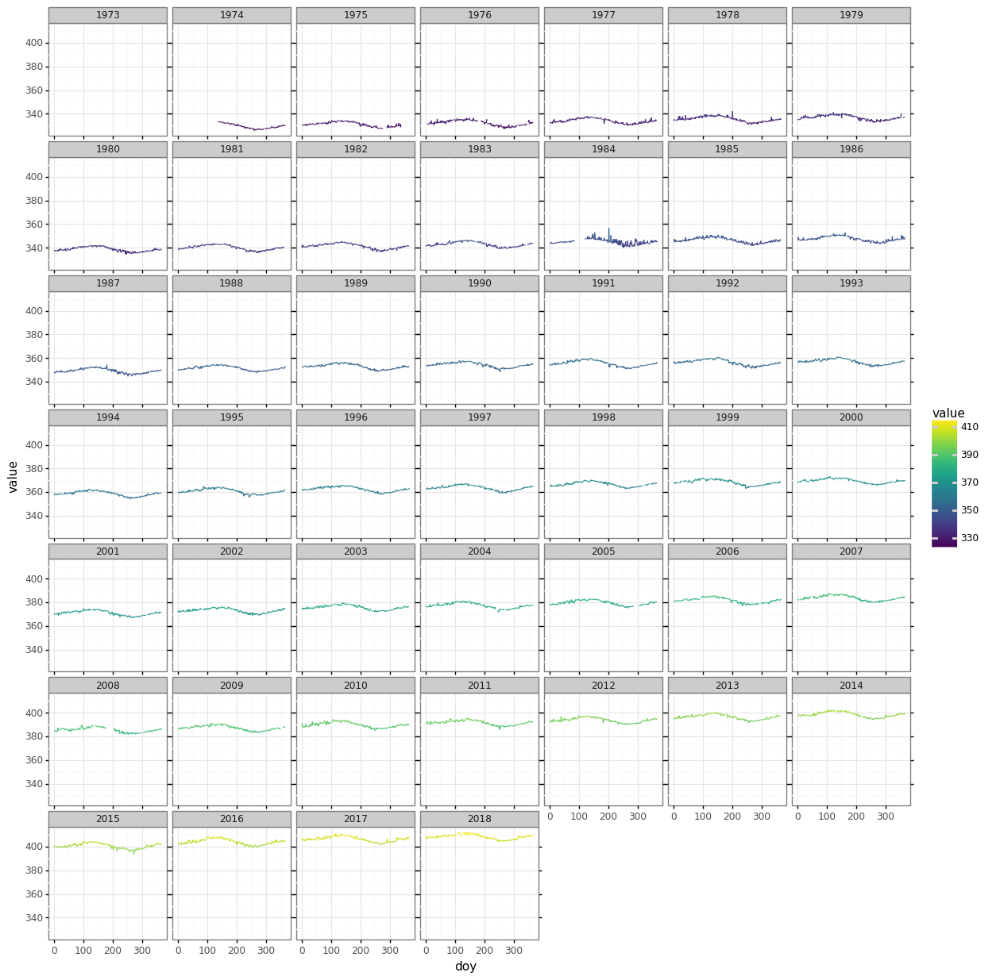

In [49]:
p = ggplot(df_daily, aes(x='doy', y='value', color='value'))
p += geom_line()
p += facet_wrap('~year', ncol=7)
p += theme_bw()
p += theme(figure_size=(14,15))
p.draw();

## Time-series prediction using the prophet library

In order to use the prophet library for creating predictions we have to create a dataframe that follows certain formatting conventions. The x-axis (time) should be called *ds*, the response variable *y*.

Since dt is currently the index we have to reset the index to convert it to a regular column. We then select the datetime column and the co2 concentration (value) and rename them to the desired format.

In [53]:
data = df_daily.reset_index()[['dt', 'value']]
data.head()
data.columns = ['ds', 'y']
data.head()

,ds,y
0,1973-01-01,NaN
1,1973-01-02,NaN
2,1973-01-03,NaN
3,1973-01-04,NaN
4,1973-01-05,NaN


Prophet follows the sklearn API schema. We first instantiate a class (`Prophet`) and then fit the data with the `fit()` method. Note that the library was originally developed from Facebook and has a focus on buisness forecasting. This, by default, the algorithm also tries to fit a weekly component which does not make sense for our data. We thus deactivate this component. However, we do activate a daily component.

Next, we fit our timeseries data and create a dataframe for the prediction timer-period of two years. We the call `predict` and have a look on the results.

,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,daily_lower,daily_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
count,7670.000000,7670.000000,7670.000000,7670.000000,7670.000000,7670.000000,7670.000000,7670.000000,7.670000e+03,7.670000e+03,7.670000e+03,7670.000000,7670.000000,7670.000000,7670.0,7670.0,7670.0,7670.000000
mean,390.714487,389.508312,391.212440,390.651298,390.775987,-0.353351,-0.353351,-0.353351,-3.533528e-01,-3.533528e-01,-3.533528e-01,0.000002,0.000002,0.000002,0.0,0.0,0.0,390.361136
std,13.364756,13.437022,13.539743,13.256550,13.473912,2.281131,2.281131,2.281131,5.257249e-14,5.257249e-14,5.257249e-14,2.281131,2.281131,2.281131,0.0,0.0,0.0,13.488642
min,368.738364,365.106749,366.752231,368.738364,368.738364,-4.191312,-4.191312,-4.191312,-3.533528e-01,-3.533528e-01,-3.533528e-01,-3.837959,-3.837959,-3.837959,0.0,0.0,0.0,365.987526
25%,379.281674,378.096854,379.715606,379.281674,379.281674,-2.336509,-2.336509,-2.336509,-3.533528e-01,-3.533528e-01,-3.533528e-01,-1.983156,-1.983156,-1.983156,0.0,0.0,0.0,378.903988
50%,390.208243,388.669411,390.321243,390.208243,390.208243,-0.055697,-0.055697,-0.055697,-3.533528e-01,-3.533528e-01,-3.533528e-01,0.297655,0.297655,0.297655,0.0,0.0,0.0,389.494686
75%,402.014423,400.570960,402.221662,402.014423,402.014423,1.513603,1.513603,1.513603,-3.533528e-01,-3.533528e-01,-3.533528e-01,1.866956,1.866956,1.866956,0.0,0.0,0.0,401.394561
max,415.381670,415.532755,418.092064,413.592496,417.108772,2.937292,2.937292,2.937292,-3.533528e-01,-3.533528e-01,-3.533528e-01,3.290644,3.290644,3.290644,0.0,0.0,0.0,416.771775


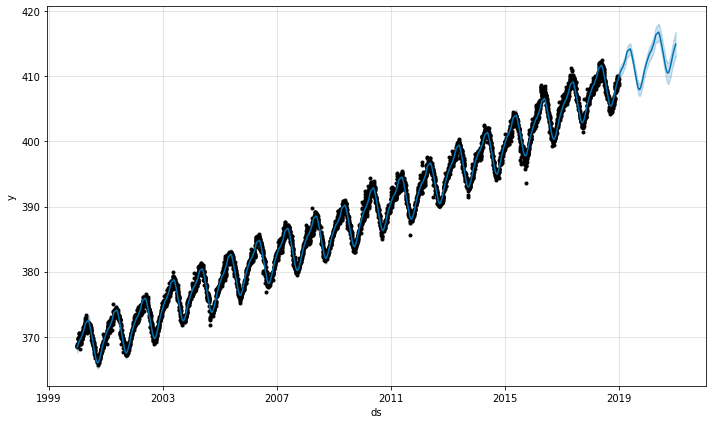

In [55]:
# create prophet model instance
m = Prophet(daily_seasonality=True, weekly_seasonality=False)

# fit our data
# we first try with a subset of the data
m.fit(data[data.ds >= '2000-1-1'])

# you could also fit the entire timeseries but this might take a bit longer...
#m.fit(data) 

# now we define an empty dataframe for the future projection timeperiod (2 years in daily resolution in this case)
future = m.make_future_dataframe(periods=2*365, freq = 'D')

# we create the forecast
forecast = m.predict(future)

# check the created dataframe and plot the timeseries with forecast
display(forecast.describe())
m.plot(forecast);

As we can see the forecast looks very plausible. We c an also look add the individual components of the forecast.

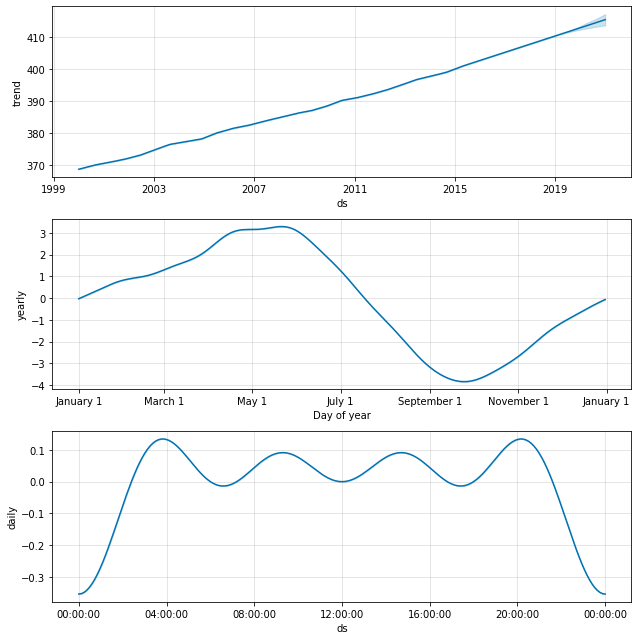

In [56]:
m.plot_components(forecast);